# Neuroevolution

Neuroevolution is a method of applying evolutionary algorithms to optimise neural networks. The neural network can be adapted in terms of parameters, hyperparameters or architecture. Prominent examples are NeuroEvolution of Augmenting Topologies (NEAT) and Covariance-Matrix Adaptation Evolution Strategy (CMA-ES). The evolutionary algorithm employed in this notebook is the genetic algorithm, excluding crossing-over. 

In [1]:
import numpy as np
np.random.seed(0)
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable

# The Neural Network Model ("Neuro"-evolution)

The neural network, or a multi-layer perceptron, is a universal function approximator. We define the neural network in PyTorch with 2 hidden layers and non-linear activation functions hyperbolic tangent (tanh) and sigmoid.

In [2]:
net = nn.Sequential(
    nn.Linear(in_features=2, out_features=16, bias=True),
    nn.Tanh(),
    nn.Linear(in_features=16, out_features=1),
    nn.Sigmoid()
)

class Net(nn.Module):
  def __init__(self, input_size, output_size, n_hidden=16):
    super(Net, self).__init__()
    self.linear1 = nn.Linear(input_size, n_hidden, bias=True)
    self.tanh1 = nn.Tanh()
    self.linear2 = nn.Linear(n_hidden, output_size)
    self.sigmoid = nn.Sigmoid()
  def forward(self, x):
    x = self.linear1(x)
    x = self.tanh1(x)
    x = self.linear2(x)
    x = self.sigmoid(x)
    return x

net = Net(2, 1)

# The Mutation Function (Neuro-"evolution")

As with the genetic algorithm, neuroevolution can be implemented by adding a Gaussian noise perturbation $\epsilon\sim N(0,\sigma)$ to all neural network parameters (weights). 

In [3]:
def get_params(net):
  return list(net.parameters())

def mutate_params(net, sigma=0.1):
  for param in net.parameters():
    param.data += torch.normal(0, sigma, size=param.data.shape)

print(f"Before mutation:\n {get_params(net)}\n")
mutate_params(net, sigma=0.1)
print(f"After mutation:\n {get_params(net)}")

Before mutation:
 [Parameter containing:
tensor([[-0.5985,  0.4917],
        [-0.0633,  0.1432],
        [ 0.3094, -0.4816],
        [-0.2772, -0.6005],
        [-0.5020, -0.0903],
        [ 0.3371, -0.1493],
        [-0.6466, -0.4469],
        [ 0.6083,  0.5705],
        [-0.5431, -0.0150],
        [ 0.3457,  0.5112],
        [-0.6700, -0.0966],
        [ 0.6679, -0.5396],
        [ 0.2121, -0.4112],
        [ 0.3969, -0.4720],
        [ 0.5546, -0.1207],
        [-0.3864,  0.3729]], requires_grad=True), Parameter containing:
tensor([-0.1281,  0.4373,  0.4592, -0.0993, -0.6697,  0.0267,  0.6746, -0.4179,
         0.4445,  0.1585, -0.0689,  0.1920,  0.5797, -0.1392, -0.0417, -0.5453],
       requires_grad=True), Parameter containing:
tensor([[ 0.1679, -0.2125, -0.1130,  0.0409, -0.2212,  0.0010, -0.0643,  0.2213,
         -0.0512,  0.1632, -0.0483,  0.0701, -0.2269, -0.2319, -0.2164, -0.1803]],
       requires_grad=True), Parameter containing:
tensor([-0.0253], requires_grad=True)]

Af

# Optimization Problem: Circles Dataset

The optimization problem is the Circles dataset from Scikit-Learn, where the neural network model must learn to predict and discriminate between the inner and outer circles. This problem is the reason we need a non-linear activation function in the neural network architecture defined previously.

tensor([[0.4839],
        [0.3917],
        [0.4997],
        [0.5347],
        [0.4956]], grad_fn=<SigmoidBackward>)

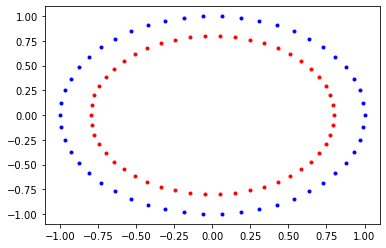

In [4]:
from sklearn.datasets import make_circles

def plot_data(X, y):
  X = X.detach().numpy()
  y = y.detach().numpy().flatten()
  plt.plot(X[y==0,0], X[y==0,1], '.', c='b', label='0')
  plt.plot(X[y==1,0], X[y==1,1], '.', c='r', label='1')

X, y = make_circles(n_samples=100)
X = torch.from_numpy(X).float()
y = torch.from_numpy(y).float().view(-1, 1)

plot_data(X, y)
net(X[:5, :])

# Process 1: Generate the initial population of neural networks.

For purpose of explanation, we use a small population size of 5 and 4 hidden units per neural network layer. Looking at the first 2 neural networks in the population, we can notice that neural network parameters are randomly initialised.

In [5]:
population_size = 5
initial_population = np.array([Net(2,1,n_hidden=4) for _ in range(population_size)])

for p in initial_population[:2]:
  print(list(p.parameters()))

[Parameter containing:
tensor([[ 0.2215, -0.1025],
        [-0.3548, -0.6888],
        [ 0.6237,  0.3281],
        [-0.6007, -0.6913]], requires_grad=True), Parameter containing:
tensor([ 0.4499,  0.2065,  0.0315, -0.2500], requires_grad=True), Parameter containing:
tensor([[0.0066, 0.0281, 0.1353, 0.0016]], requires_grad=True), Parameter containing:
tensor([0.0507], requires_grad=True)]
[Parameter containing:
tensor([[ 0.3563, -0.0548],
        [-0.6633,  0.2389],
        [-0.0208,  0.1780],
        [ 0.0464, -0.0717]], requires_grad=True), Parameter containing:
tensor([ 0.3902, -0.0124,  0.4183,  0.4199], requires_grad=True), Parameter containing:
tensor([[-0.1430,  0.0287,  0.0106,  0.1742]], requires_grad=True), Parameter containing:
tensor([0.0604], requires_grad=True)]


# Process 2: Compute the fitness of the population.

The fitness function measures the performance of an individual neural network. We use the negative binary cross entropy error (BCE), which is negated to reflect a higher value as more desirable.

In [6]:
def fitness_function(net):
  return -nn.BCELoss()(net(X), y).detach().numpy().item()

fitness_score = fitness_function(net)
fitness_score

-0.7074669003486633

In [7]:
def compute_fitness(population):
  return np.array([fitness_function(individual) for individual in population])

fitness_scores = compute_fitness(initial_population)
fitness_scores

array([-0.69372076, -0.69437325, -0.69708216, -0.7153697 , -0.7563709 ])

# Process 3: Select the fittest neural networks.

Select the top $k$ percentage of neural networks with the highest fitness score to form the parent subpopulation.

In [8]:
def solution(individual):
  return individual(X).view(-1).detach().numpy().round()

def get_fittest(population, fitness_scores):
  return population[fitness_scores.argmax()]

def select_fittest(population, fitness_scores, k=0.5):
  return population[np.argsort(fitness_scores)[-int(len(population) * k):]]

parent_subpopulation = select_fittest(initial_population, fitness_scores, k=0.4)
parent_subpopulation, compute_fitness(parent_subpopulation)

(array([Net(
   (linear1): Linear(in_features=2, out_features=4, bias=True)
   (tanh1): Tanh()
   (linear2): Linear(in_features=4, out_features=1, bias=True)
   (sigmoid): Sigmoid()
 ),
        Net(
   (linear1): Linear(in_features=2, out_features=4, bias=True)
   (tanh1): Tanh()
   (linear2): Linear(in_features=4, out_features=1, bias=True)
   (sigmoid): Sigmoid()
 )], dtype=object), array([-0.69437325, -0.69372076]))

# Process 4: Perform reproduction of the parents to replenish the population.

In contrast to common implementations of genetic algorithms, no crossing-over is performed. Parent neural networks are sampled to create an identical copy as the child.

In [9]:
import copy

def perform_reproduction(subpopulation):
  num_children = population_size - len(subpopulation)
  parents = np.random.choice(subpopulation, num_children)
  return np.append(subpopulation, [copy.deepcopy(p) for p in parents], axis=0)

next_population = perform_reproduction(parent_subpopulation)
next_population, compute_fitness(next_population)

(array([Net(
   (linear1): Linear(in_features=2, out_features=4, bias=True)
   (tanh1): Tanh()
   (linear2): Linear(in_features=4, out_features=1, bias=True)
   (sigmoid): Sigmoid()
 ),
        Net(
   (linear1): Linear(in_features=2, out_features=4, bias=True)
   (tanh1): Tanh()
   (linear2): Linear(in_features=4, out_features=1, bias=True)
   (sigmoid): Sigmoid()
 ),
        Net(
   (linear1): Linear(in_features=2, out_features=4, bias=True)
   (tanh1): Tanh()
   (linear2): Linear(in_features=4, out_features=1, bias=True)
   (sigmoid): Sigmoid()
 ),
        Net(
   (linear1): Linear(in_features=2, out_features=4, bias=True)
   (tanh1): Tanh()
   (linear2): Linear(in_features=4, out_features=1, bias=True)
   (sigmoid): Sigmoid()
 ),
        Net(
   (linear1): Linear(in_features=2, out_features=4, bias=True)
   (tanh1): Tanh()
   (linear2): Linear(in_features=4, out_features=1, bias=True)
   (sigmoid): Sigmoid()
 )], dtype=object),
 array([-0.69437325, -0.69372076, -0.69437325, -0.6943

# Process 5: Perform mutation on the population.

As explained previously, add a Gaussian noise perturbation to all parameters of the neural network.

In [10]:
def get_population_parameter(population, index):
  return [get_params(net)[index] for net in population]

def perform_mutation(population, sigma=0.1):
  for individual in population:
    mutate_params(individual, sigma=0.1)
  return population

print("Before mutation:")
print(get_population_parameter(next_population, 1))

perform_mutation(next_population)

print("\nAfter mutation:")
print(get_population_parameter(next_population, 1))

Before mutation:
[Parameter containing:
tensor([ 0.3902, -0.0124,  0.4183,  0.4199], requires_grad=True), Parameter containing:
tensor([ 0.4499,  0.2065,  0.0315, -0.2500], requires_grad=True), Parameter containing:
tensor([ 0.3902, -0.0124,  0.4183,  0.4199], requires_grad=True), Parameter containing:
tensor([ 0.3902, -0.0124,  0.4183,  0.4199], requires_grad=True), Parameter containing:
tensor([ 0.4499,  0.2065,  0.0315, -0.2500], requires_grad=True)]

After mutation:
[Parameter containing:
tensor([ 0.2092, -0.0546,  0.4219,  0.3351], requires_grad=True), Parameter containing:
tensor([ 0.4878,  0.0379,  0.2894, -0.2511], requires_grad=True), Parameter containing:
tensor([ 0.4366, -0.1424,  0.3989,  0.3069], requires_grad=True), Parameter containing:
tensor([0.2994, 0.1719, 0.3107, 0.3521], requires_grad=True), Parameter containing:
tensor([ 0.4133,  0.2068,  0.0257, -0.2052], requires_grad=True)]


# The Neuroevolution Algorithm: All 5 Processes Together

Algorithm:
1. Generate the initial population of individuals.
2. Repeat until convergence:
  1. Compute fitness of the population.
  2. Select the fittest individuals (parent subpopulation).
  3. Perform reproduction between parents to produce children.
  4. Perform mutation on the population.
3. Select the fittest individual of the population as the solution.

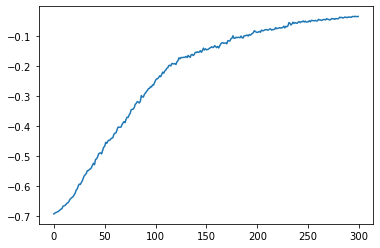

In [11]:
from tqdm.notebook import tqdm

# Neuroevolution hyperparameters
population_size = 100
num_generations = 300
top_k = 0.1
mutation_sigma = 0.1
n_hidden = 16

# Process 1: Generate the initial population.
population = np.array([Net(2, 1, n_hidden) for _ in range(population_size)])

# Misc: Experimental tracking
scores = []
solutions = []
fittests = []

for i in tqdm(range(num_generations)):
  # Process 2: Compute fitness of the population.
  fitness_scores = compute_fitness(population)

  # Process 3: Select the fittest individuals.
  fittest_subpopulation = select_fittest(population, fitness_scores, k=top_k)
  
  # Misc: Experimental tracking
  fittest = get_fittest(population, fitness_scores)
  fittests.append(fittest)
  solutions.append(solution(fittest))
  scores.append(fitness_function(fittest))

  # Process 4: Perform reproduction between parents.
  children = perform_reproduction(fittest_subpopulation)

  # Process 5: Perform mutation on the population.
  population = perform_mutation(children, sigma=mutation_sigma)


# Misc: Experimental tracking
plt.plot(np.arange(num_generations), scores)
plt.show()

# Experiment Result

The background colours illustrate the neural network's decision boundary, while the individual data points are the original dataset. Looking at the fittest individual neural network of the final population, the non-linear decision boundary has been correctly learnt by the fittest neural network in the final population.

Fittest score: -0.04997977614402771


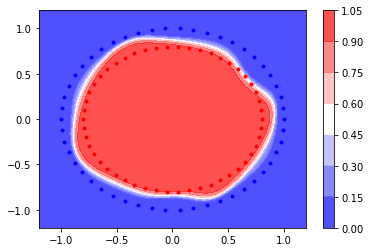

In [12]:
def plot_individual(net):
  x1 = np.arange(X[:,0].min()*1.2, X[:,0].max()*1.2, 0.01)
  x2 = np.arange(X[:,1].min()*1.2, X[:,1].max()*1.2, 0.01)
  X1, X2 = np.meshgrid(x1, x2)

  Y = np.zeros(X1.shape).flatten()
  for i, [x1, x2] in enumerate(zip(X1.flatten(), X2.flatten())):
    Y[i] = np.asarray(net(Variable(torch.Tensor([x1,x2])).float()).data)
  Y = Y.reshape(X1.shape)

  plt.xlim(min(X[:,0])*1.2, max(X[:,0])*1.2)
  plt.ylim(min(X[:,1])*1.2, max(X[:,1])*1.2)
  plt.contourf(X1, X2, Y, cmap='bwr', alpha=0.8)
  plt.colorbar()


fitness_score = fitness_function(fittest)
print(f"Fittest score: {fitness_score}")

plot_data(X, y)
plot_individual(fittest)

To conclude the tutorial, let's visualise the optimisation process. If the interactive demo does not work for you, please view this notebook on [jupyter/nbviewer](https://nbviewer.jupyter.org/).

In [13]:
%%capture
from matplotlib.animation import FuncAnimation

fig, ax = plt.subplots()

plot_data(X, y)
ax.set_xlim(min(X[:,0]*1.2), max(X[:,0])*1.2)
ax.set_ylim(min(X[:,1]*1.2), max(X[:,1])*1.2)

x1 = np.arange(X[:,0].min()*1.2, X[:,0].max()*1.2, 0.01)
x2 = np.arange(X[:,1].min()*1.2, X[:,1].max()*1.2, 0.01)
X1, X2 = np.meshgrid(x1, x2)

def animate(i):
  net = fittests[i]
  Y = net(torch.Tensor(np.stack([X1.flatten(), X2.flatten()], axis=1))).detach().numpy().reshape(X1.shape)
  ax.contourf(X1, X2, Y, cmap='bwr', alpha=0.8)
  ax.set_xlabel(f'Gen {i+1}')

ani = FuncAnimation(fig, animate, frames=np.arange(0, num_generations), interval=80, repeat=False)

In [14]:
from IPython import display as ipythondisplay
from IPython.display import HTML

HTML(ani.to_jshtml())

In [15]:
ani.save('neuroevolution.gif')

MovieWriter ffmpeg unavailable; using Pillow instead.


<img src="neuroevolution.gif">